# Differences of the 3-channel vs. 4-channel imaging setup.

---
This notebook summarizes the analysis corresponding to the differences of the 3 and 4 channel setup.

---

## 0. Environmental setup

In [32]:
import pandas as pd
import numpy as np
import seaborn as sns
import random
import os
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 300

import sys

sys.path.append("../..")
from src.utils.notebooks.eda import *
from src.utils.notebooks.figure3 import *
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

seed = 1234
random.seed(1234)
np.random.seed(1234)

%reload_ext nb_black

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [34]:
import re


def sorted_nicely(l):
    """ Sort the given iterable in the way that humans expect."""
    convert = lambda text: int(text) if text.isdigit() else text
    alphanum_key = lambda key: [convert(c) for c in re.split("([0-9]+)", key)]
    return sorted(l, key=alphanum_key)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [210]:
def plot_channel_markers_dist(
    data,
    markers,
    marker_labels,
    quantiles=None,
    cut=2,
    plot_type="violin",
    palette=None,
    figsize=[4, 4],
):
    for i in range(len(markers)):
        fig, ax = plot_marker_distribution(
            data,
            figsize=figsize,
            marker=markers[i],
            label_col="imaging",
            order=["3channel", "4channel"],
            box_pairs=[
                ("3channel", "4channel"),
            ],
            stat_annot="star",
            quantiles=quantiles,
            cut=cut,
            plot_type=plot_type,
            palette=palette,
        )
        ax.set_xlabel("Imaging condition")
        ax.set_ylabel(marker_labels[i])
        plt.show()
        plt.close()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
color_palette = {"3channel": "purple", "4channel": "pink"}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 1. Read in data

To assess the differences in the cancer populations compared to the control population, we obtained PBMCs of 10 healthy control samples and 10 cancer patients of various cancer types. For each patient we obtained a number of images of the PBMCs showing their DNA, gH2AX and Lamin A/C content using corresponding fluorescent stains.

First, we read in the required data set that describe each PBMCs by a number of hand-crafted features extracted from the fluorescent images of the cells.

### 1.1 3-channel data

In [39]:
feature_file_path = "/preprocessed/full_pipeline/nuclear_features.csv"
qc_result_file_path = "/preprocessed/full_pipeline/segmentation/qc_results.csv"

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Healthy controls

In [40]:
hv_ch3_root_data_dir = "../../data/control/proteins/"

hv_ch3_data = read_in_protein_dataset(
    data_dir=hv_ch3_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
)
hv_ch3_data["id"] = hv_ch3_data["sample"] + hv_ch3_data["timepoint"]
hv_ch3_data["imaging"] = "3channel"
hv_ch3_data["timepoint"] = "ctrl"
hv_ch3_data["condition"] = "Control"

hv_ch3_data["file_name"] = np.array(list(hv_ch3_data.index))

Load data: 100%|██████████| 10/10 [00:00<00:00, 50.64it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Glioma

In [41]:
gl_ch3_tp1_root_data_dir = "../../data/pancancer/proteins/timepoint_1"
gl_samples = ["p15", "p16"]

gl_ch3_tp1_data = read_in_protein_dataset(
    data_dir=gl_ch3_tp1_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=gl_samples,
)
gl_ch3_tp1_data["id"] = gl_ch3_tp1_data["sample"] + gl_ch3_tp1_data["timepoint"] + "3ch"
gl_ch3_tp1_data["imaging"] = "3channel"
gl_ch3_tp1_data["condition"] = "Glioma"
gl_ch3_tp1_data["timepoint"] = "prior"

gl_ch3_tp1_data["file_name"] = np.array(list(gl_ch3_tp1_data.index))

Load data: 100%|██████████| 10/10 [00:00<00:00, 32.88it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Head & Neck cancers

In [42]:
hn_ch3_tp1_root_data_dir = "../../data/pancancer/proteins/timepoint_1"
hn_samples = ["p14", "p18"]

hn_ch3_tp1_data = read_in_protein_dataset(
    data_dir=hn_ch3_tp1_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=hn_samples,
)
hn_ch3_tp1_data["id"] = hn_ch3_tp1_data["sample"] + hn_ch3_tp1_data["timepoint"] + "3ch"
hn_ch3_tp1_data["imaging"] = "3channel"
hn_ch3_tp1_data["condition"] = "Head & Neck"
hn_ch3_tp1_data["timepoint"] = "prior"

hn_ch3_tp1_data["file_name"] = np.array(list(hn_ch3_tp1_data.index))

Load data: 100%|██████████| 10/10 [00:00<00:00, 33.10it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 1.1 4-channel data

#### Glioma

In [43]:
gl_ch4_tp1_root_data_dir = "../../data/glioma/proteins/timepoint_1"

gl_ch4_tp1_data = read_in_protein_dataset(
    data_dir=gl_ch4_tp1_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=gl_samples,
)
gl_ch4_tp1_data["id"] = gl_ch4_tp1_data["sample"] + gl_ch4_tp1_data["timepoint"] + "4ch"
gl_ch4_tp1_data["imaging"] = "4channel"
gl_ch4_tp1_data["condition"] = "Glioma"
gl_ch4_tp1_data["timepoint"] = "prior"

gl_ch4_tp1_data["file_name"] = np.array(list(gl_ch4_tp1_data.index))

Load data: 100%|██████████| 8/8 [00:00<00:00, 41.10it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [44]:
gl_ch4_tp2_root_data_dir = "../../data/glioma/proteins/timepoint_2"

gl_ch4_tp2_data = read_in_protein_dataset(
    data_dir=gl_ch4_tp2_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=gl_samples,
)
gl_ch4_tp2_data["id"] = gl_ch4_tp2_data["sample"] + gl_ch4_tp2_data["timepoint"]
gl_ch4_tp2_data["imaging"] = "4channel"
gl_ch4_tp2_data["condition"] = "Glioma"
gl_ch4_tp2_data["timepoint"] = "during"

gl_ch4_tp2_data["file_name"] = np.array(list(gl_ch4_tp2_data.index))

Load data: 100%|██████████| 8/8 [00:00<00:00, 34.27it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
gl_ch4_tp3_root_data_dir = "../../data/glioma/proteins/timepoint_3"

gl_ch4_tp3_data = read_in_protein_dataset(
    data_dir=gl_ch4_tp3_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=gl_samples,
)
gl_ch4_tp3_data["id"] = gl_ch4_tp3_data["sample"] + gl_ch4_tp3_data["timepoint"]
gl_ch4_tp3_data["imaging"] = "4channel"
gl_ch4_tp3_data["condition"] = "Glioma"
gl_ch4_tp3_data["timepoint"] = "end"

gl_ch4_tp3_data["file_name"] = np.array(list(gl_ch4_tp3_data.index))

Load data: 100%|██████████| 8/8 [00:00<00:00, 34.72it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Head & Neck cancers

In [46]:
hn_ch4_tp1_root_data_dir = "../../data/headneck/proteins/timepoint_1"

hn_ch4_tp1_data = read_in_protein_dataset(
    data_dir=hn_ch4_tp1_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=hn_samples,
)
hn_ch4_tp1_data["id"] = hn_ch4_tp1_data["sample"] + hn_ch4_tp1_data["timepoint"] + "4ch"
hn_ch4_tp1_data["imaging"] = "4channel"
hn_ch4_tp1_data["condition"] = "Head & Neck"
hn_ch4_tp1_data["timepoint"] = "prior"

hn_ch4_tp1_data["file_name"] = np.array(list(hn_ch4_tp1_data.index))

Load data: 100%|██████████| 8/8 [00:00<00:00, 31.16it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
hn_ch4_tp2_root_data_dir = "../../data/headneck/proteins/timepoint_2"

hn_ch4_tp2_data = read_in_protein_dataset(
    data_dir=hn_ch4_tp2_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=hn_samples,
)
hn_ch4_tp2_data["id"] = hn_ch4_tp2_data["sample"] + hn_ch4_tp2_data["timepoint"]
hn_ch4_tp2_data["imaging"] = "4channel"
hn_ch4_tp2_data["condition"] = "Head & Neck"
hn_ch4_tp2_data["timepoint"] = "during"

hn_ch4_tp2_data["file_name"] = np.array(list(hn_ch4_tp2_data.index))

Load data: 100%|██████████| 8/8 [00:00<00:00, 30.51it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [48]:
hn_ch4_tp3_root_data_dir = "../../data/headneck/proteins/timepoint_3"

hn_ch4_tp3_data = read_in_protein_dataset(
    data_dir=hn_ch4_tp3_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    filter_samples=hn_samples,
)
hn_ch4_tp3_data["id"] = hn_ch4_tp3_data["sample"] + hn_ch4_tp3_data["timepoint"]
hn_ch4_tp3_data["imaging"] = "4channel"
hn_ch4_tp3_data["condition"] = "Head & Neck"
hn_ch4_tp3_data["timepoint"] = "end"

hn_ch4_tp3_data["file_name"] = np.array(list(hn_ch4_tp3_data.index))

Load data: 100%|██████████| 8/8 [00:00<00:00, 38.11it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 2. Data preprocessing

Before we analyze the data, we will first preprocess it.

To this end, we first remove features with missing values and samples with missing features.

In [49]:
hv_ch3_data = preprocess_data(hv_ch3_data, remove_constant_features=False)

gl_ch3_tp1_data = preprocess_data(gl_ch3_tp1_data, remove_constant_features=False)
gl_ch4_tp1_data = preprocess_data(gl_ch4_tp1_data, remove_constant_features=False)
gl_ch4_tp2_data = preprocess_data(gl_ch4_tp2_data, remove_constant_features=False)
gl_ch4_tp3_data = preprocess_data(gl_ch4_tp3_data, remove_constant_features=False)

hn_ch3_tp1_data = preprocess_data(hn_ch3_tp1_data, remove_constant_features=False)
hn_ch4_tp1_data = preprocess_data(hn_ch4_tp1_data, remove_constant_features=False)
hn_ch4_tp2_data = preprocess_data(hn_ch4_tp2_data, remove_constant_features=False)
hn_ch4_tp3_data = preprocess_data(hn_ch4_tp3_data, remove_constant_features=False)

all_data = (
    hv_ch3_data.append(gl_ch3_tp1_data)
    .append(gl_ch4_tp1_data)
    .append(gl_ch4_tp2_data)
    .append(gl_ch4_tp3_data)
    .append(hn_ch3_tp1_data)
    .append(hn_ch4_tp1_data)
    .append(hn_ch4_tp2_data)
    .append(hn_ch4_tp3_data)
)

all_data = preprocess_data(all_data, remove_constant_features=False)
all_data.index = list(range(len(all_data)))

Nuclei that did not pass the quality check: 185/2531. Remaining: 2346.
Removed 12 constant or features with missing values. Remaining: 272.
Removed additional 6 features. Remaining: 266.
Nuclei that did not pass the quality check: 40/1425. Remaining: 1385.
Removed 9 constant or features with missing values. Remaining: 275.
Removed additional 6 features. Remaining: 269.
Nuclei that did not pass the quality check: 30/1000. Remaining: 970.
Removed 12 constant or features with missing values. Remaining: 292.
Removed additional 6 features. Remaining: 286.
Nuclei that did not pass the quality check: 69/1039. Remaining: 970.
Removed 9 constant or features with missing values. Remaining: 295.
Removed additional 6 features. Remaining: 289.
Nuclei that did not pass the quality check: 7/856. Remaining: 849.
Removed 12 constant or features with missing values. Remaining: 292.
Removed additional 6 features. Remaining: 286.
Nuclei that did not pass the quality check: 87/1866. Remaining: 1779.
Remove

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

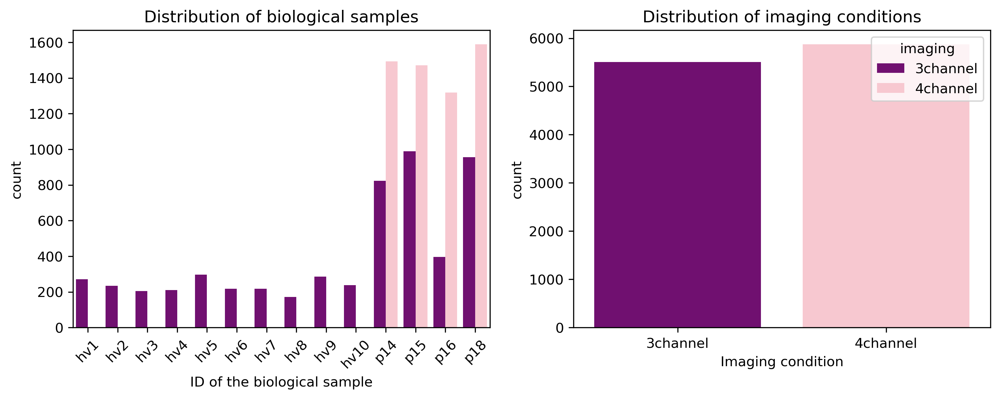

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [50]:
fig, ax = plt.subplots(figsize=[12, 4], ncols=2)
cond_order = ["3channel", "4channel"]
sample_order = sorted_nicely(np.unique(all_data.loc[:, "sample"]))
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=all_data,
    ax=ax[0],
    order=sample_order,
    hue_order=cond_order,
    hue="imaging",
    dodge=True,
    palette=color_palette,
)
ax[0].legend([], [], frameon=False)
ax[0].set_xlabel("ID of the biological sample")
ax[0].set_title("Distribution of biological samples")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)

ax[1] = sns.countplot(
    x="imaging",
    hue="imaging",
    data=all_data,
    ax=ax[1],
    order=cond_order,
    dodge=False,
    palette=color_palette,
    hue_order=cond_order,
)
ax[1].set_xlabel("Imaging condition")
ax[1].set_title("Distribution of imaging conditions")

plt.show()
plt.close()

Note that while the data set consists of 10 cancer patients and 10 healthy controls the number of nuclei varies significantly between each biological sample.

___

#### Subsampling

We first subsample the data set such that for each condition (control vs. cancer) we have the same number of nuclei in the data set. Additionally, we ensure that for the cancer population we have approximately equal number of nuclei from each biological sample.

In [51]:
sampled_imaging_cond_data = get_stratified_data(
    all_data.loc[all_data.timepoint == "prior"],
    id_column="id",
    cond_column="imaging",
    seed=1234,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

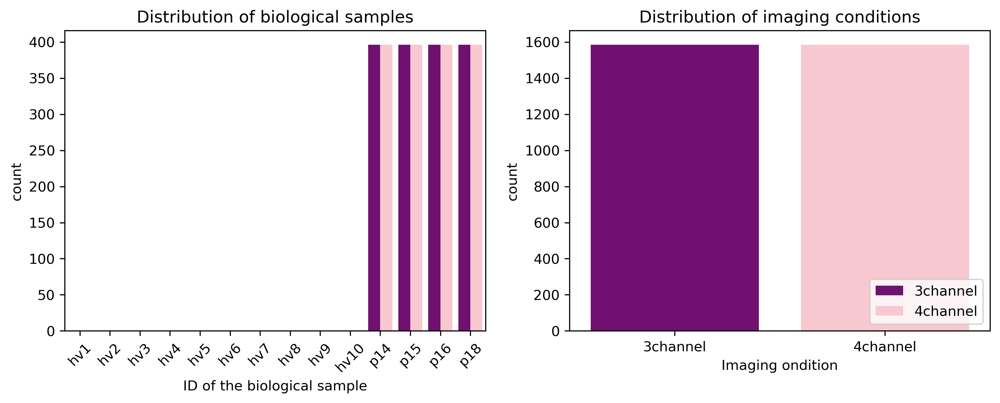

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [52]:
fig, ax = plt.subplots(figsize=[12, 4], ncols=2)
cond_order = ["3channel", "4channel"]
sample_order = sorted_nicely(np.unique(all_data.loc[:, "sample"]))
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=sampled_imaging_cond_data,
    ax=ax[0],
    order=sample_order,
    hue_order=cond_order,
    hue="imaging",
    dodge=True,
    palette=color_palette,
)
ax[0].legend([], [], frameon=False)
ax[0].set_xlabel("ID of the biological sample")
ax[0].set_title("Distribution of biological samples")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)

ax[1] = sns.countplot(
    x="imaging",
    hue="imaging",
    data=sampled_imaging_cond_data,
    ax=ax[1],
    order=cond_order,
    dodge=False,
    palette=color_palette,
    hue_order=cond_order,
)
ax[1].set_xlabel("Imaging ondition")
ax[1].set_title("Distribution of imaging conditions")
ax[1].legend(loc="lower right")

plt.show()
plt.close()

----

#### Sample and feature selection

We now filter out constant features and nuclei with missing features. We will do that for both replicates individually. However, we will also combine the two replicates to provide a joint analysis.

In [53]:
data = preprocess_data(sampled_imaging_cond_data, remove_constant_features=True)

Nuclei that did not pass the quality check: 0/3168. Remaining: 3168.
Removed 5 constant or features with missing values. Remaining: 261.
Removed additional 0 features. Remaining: 261.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### Data preparation

After sampling the data, we will now prepare the data for the consecutive analysis, i.e. extracting only chrometric features and corresponding metadata information.

In [54]:
all_chrometric_data = get_chrometric_data(
    data,
    proteins=["gh2ax", "lamin", "cd3"],
    exclude_dna_int=True,
)

sample_labels = data.loc[:, "sample"]
cond_labels = data.loc[:, "condition"]
imaging_labels = data.loc[:, "imaging"]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Finally, we remove highly correlated features (Pearson $\rho > 0.8$) from the chrometric features.

In [55]:
chrometric_data = remove_correlated_features(all_chrometric_data, threshold=0.8)

Removed 138/193 features with a Pearson correlation above 0.8. Remaining: 55


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 3. Panels

Now we generate the individual panels for figure 2 of the paper.


### 3a. Visualization of the 3channel vs 4 channel populations

In [56]:
image_file_path = "preprocessed/full_pipeline/segmentation/nuclei_images"
sampled_3ch_images = get_random_images(
    data.loc[data.imaging == "3channel"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
)

sampled_4ch_images = get_random_images(
    data.loc[data.imaging == "4channel"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### 3 channel population

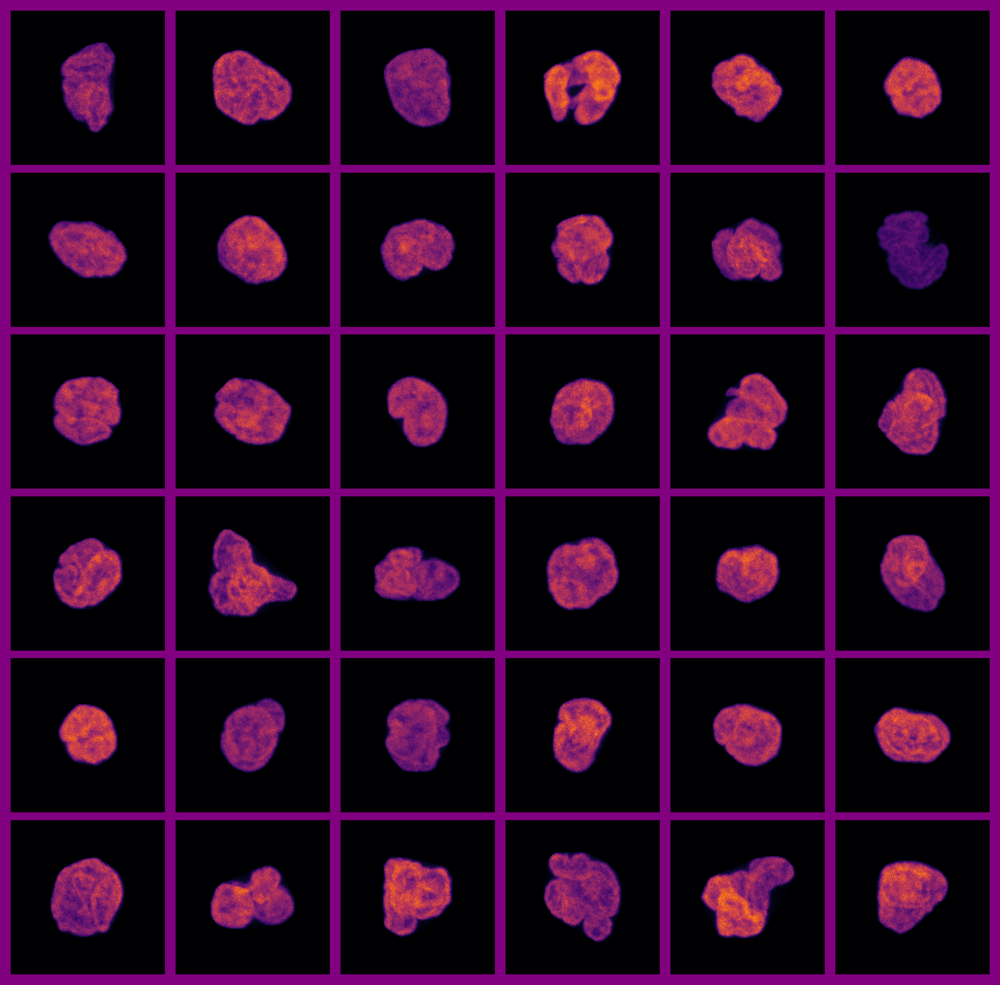

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [57]:
fig_3ch, ax_3ch = plot_montage(
    sampled_3ch_images, pad_size=150, cmap="inferno", channel_first=False
)
fig_3ch.set_facecolor(color_palette["3channel"])

#### Cancer population

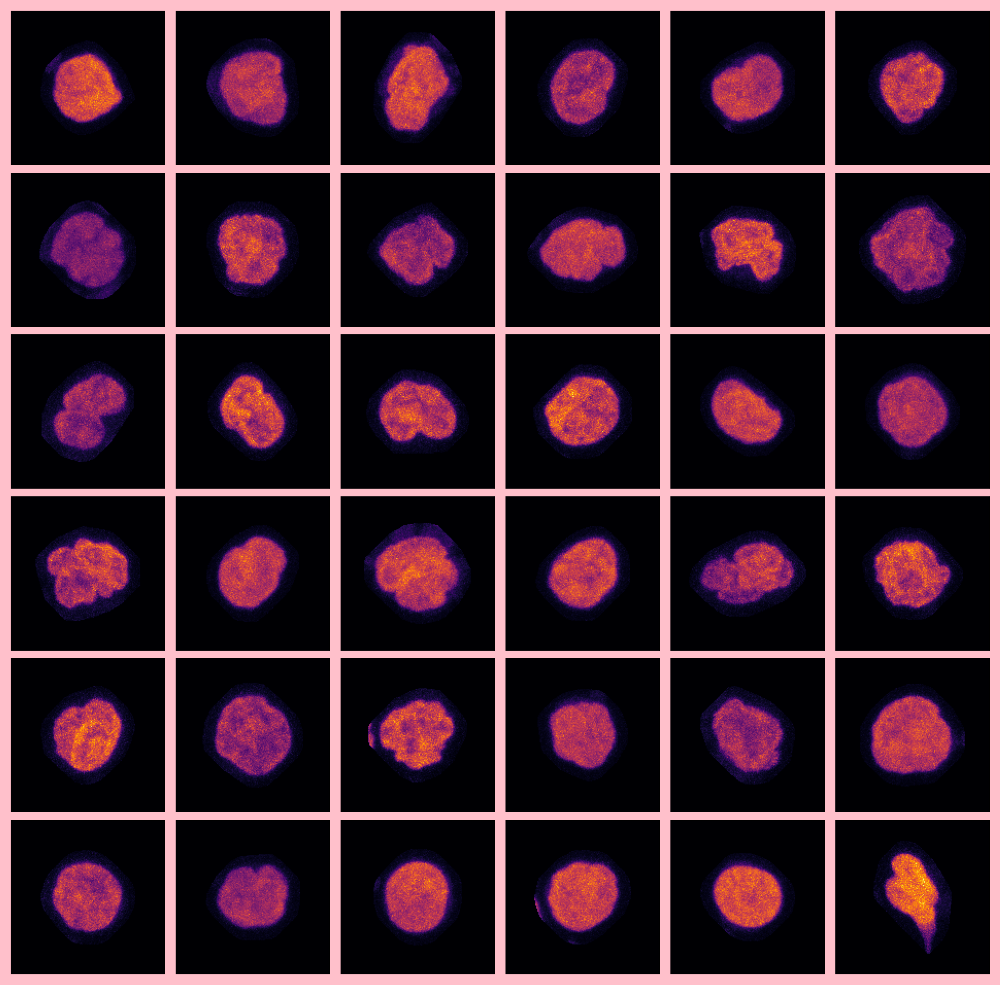

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [58]:
fig_4ch, ax_4ch = plot_montage(
    sampled_4ch_images, pad_size=150, cmap="inferno", channel_first=True
)
fig_4ch.set_facecolor(color_palette["4channel"])

---

### 3b. Parametric analysis captures small-scale differences between 3 channel and 4 channel setup.

In [59]:
chrometric_embs = get_tsne_embs(all_data.loc[:, chrometric_data.columns])
chrometric_embs["condition"] = np.array(all_data.loc[:, "condition"])
chrometric_embs["sample"] = np.array(all_data.loc[:, "sample"])
chrometric_embs["imaging"] = np.array(all_data.loc[:, "imaging"])
chrometric_embs["timepoint"] = np.array(all_data.loc[:, "timepoint"])

/home/paysan_d/miniconda3/envs/icp/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

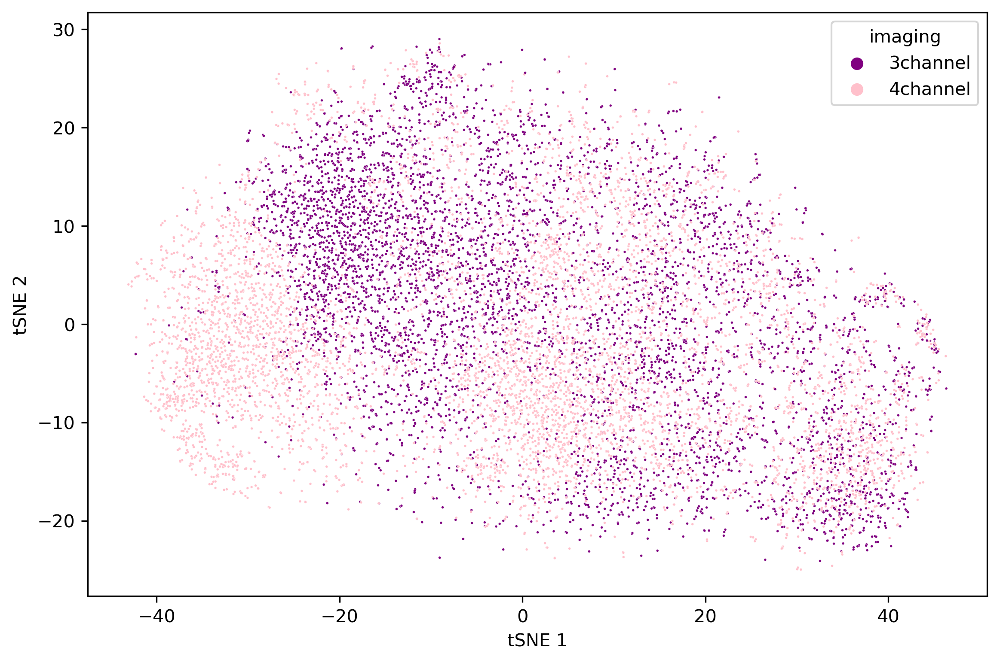

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [60]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="imaging",
    hue_order=["3channel", "4channel"],
    ax=ax,
    s=2,
    marker="o",
    palette=color_palette,
)
plt.show()

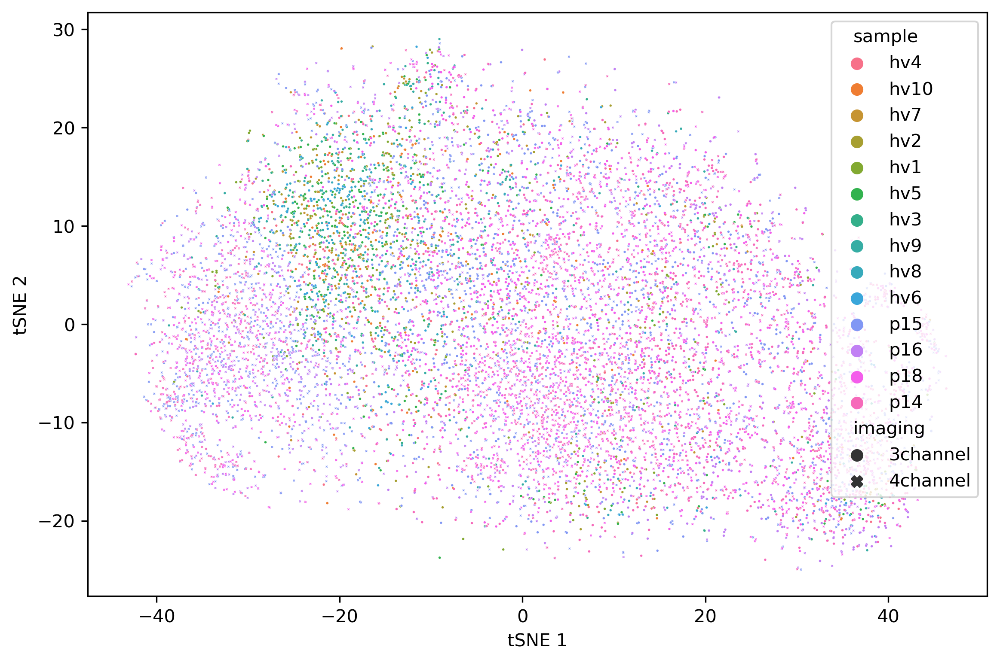

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [61]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="sample",
    style="imaging",
    ax=ax,
    s=2,
    marker="o",
)
plt.show()

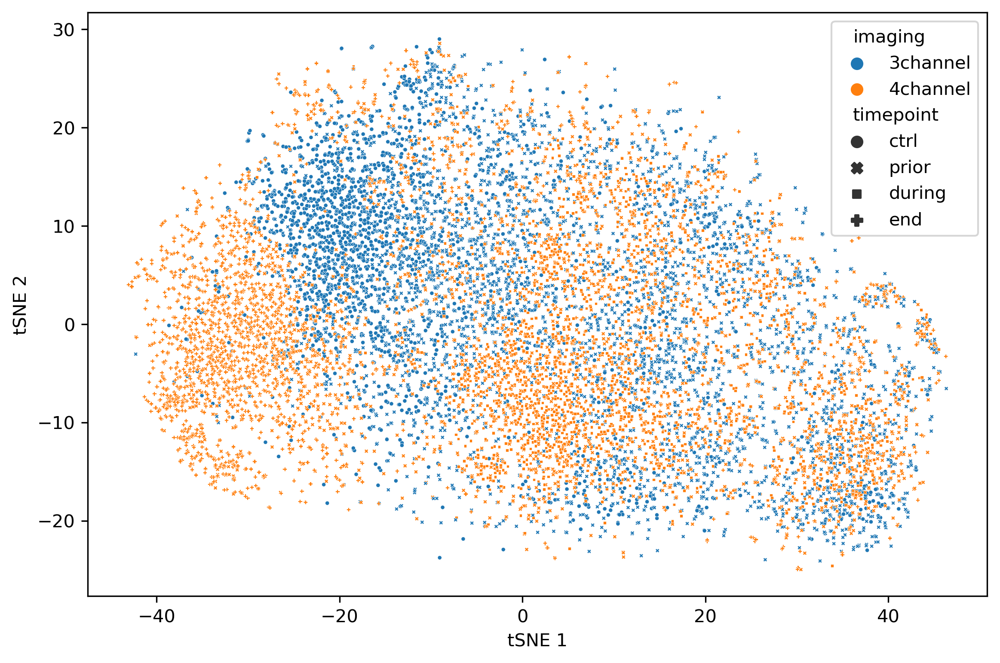

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [62]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    style="timepoint",
    hue="imaging",
    ax=ax,
    s=5,
    marker="o",
)
plt.show()

---

#### Classification of the 3-channel resp. 4-channel PBMCs

We will now train a RandomForest classifier to distinguish between the 3 and the 4 channel setup by using a StratifiedGroup 4-fold evaluation setup using the data of the four cancer patients for which both the 3 and the four channel data is available. We will then also use on of the trained models to obtain prediction probabilities for each cell of the control and the other treatment distributions. We are then interested to identify a subset of cells of the control condition that are predicted to come from the four channel imaging setup.

In [63]:
rfc = RandomForestClassifier(
    n_estimators=500, n_jobs=10, random_state=seed, class_weight="balanced"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

First, however we assess how different the four channel and 3 channel data looks.

In [64]:
cond_cv_conf_mtx_patient = get_cv_conf_mtx(
    estimator=rfc,
    features=chrometric_data,
    labels=imaging_labels,
    groups=sample_labels,
    scale_features=False,
    n_folds=4,
    order=cond_order,
)
normalized_cv_conf_mtx_patient = cond_cv_conf_mtx_patient.divide(
    cond_cv_conf_mtx_patient.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

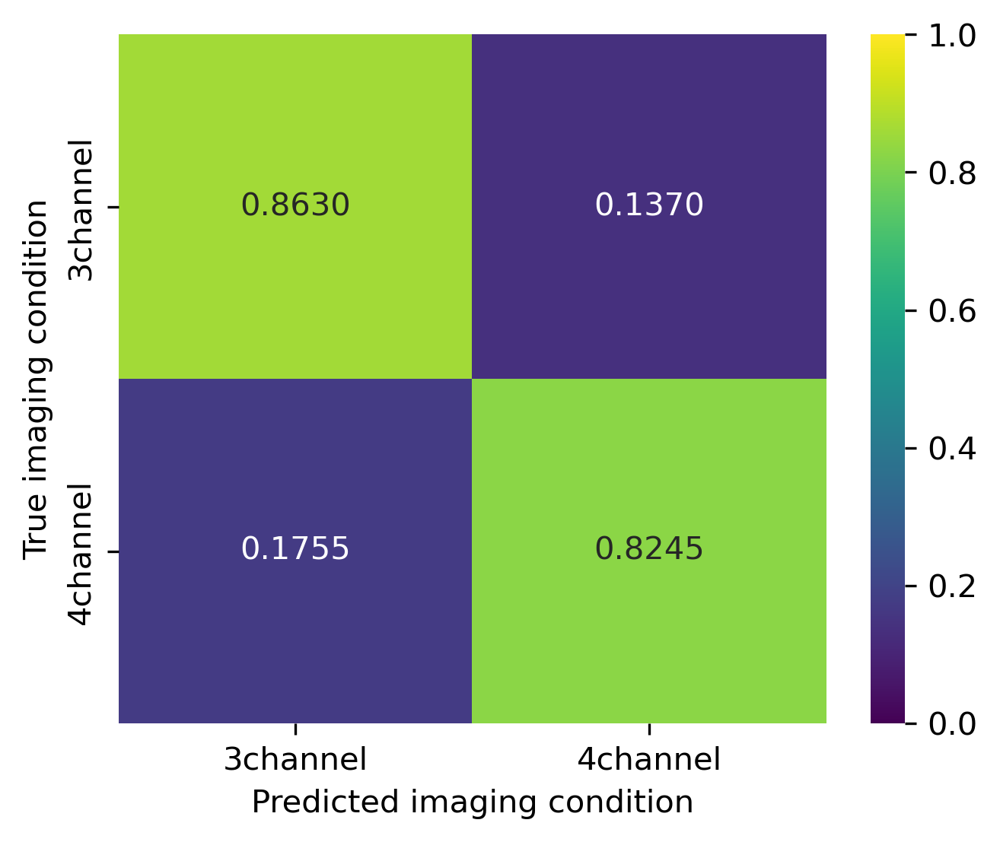

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [65]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    normalized_cv_conf_mtx_patient,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted imaging condition")
ax.set_ylabel("True imaging condition")
plt.show()

The classifier is able to accurately distinguish nuclei from the two different imaging conditions in the four-fold stratified patient cross-validation approach.


#### Feature importance

After having validated that there are significant differences between the 3 channel and the 4 channel population with respect to the chrometric pheontypes of the PBMCS, we next assess the implicit feature importance of a RandomForest classifier trained on the task to distinguish between 3 channel and 4 channel samples in order to get an idea of the features which are most indicative of the channel condition.

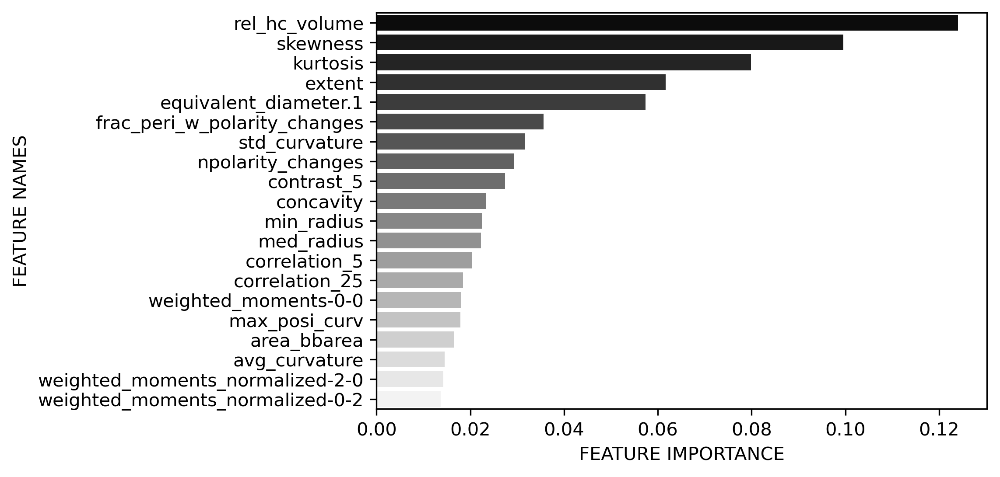

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [66]:
fig, ax = plot_feature_importance_for_estimator(
    rfc,
    chrometric_data,
    imaging_labels,
    scale_features=False,
    cmap="gray",
    figsize=[6, 4],
)

We note that the most discriminative features are related to the DNA intensity distribution as well as the heterochromatin content. Unfortunately these are also features that change the most during the treatment and between the control and the cancer population.

#### Prediction probabilities as a proxy for the imaging-setup specificity

As described earlier we will now again train the RandomForest classifier in the patient-based 4-fold stratified cross-validation approach and thereby obtain the prediction probabilities for all nuclei of the four patients for which both the 3 channel and 4 channel data is available. We will then use one of the trained models in order to additionally obtain prediction probabilities for the other treatment and control population nuclei. We will then look at the distribution of those across the different conditions and timepoints.

In [67]:
rfc = RandomForestClassifier(
    n_estimators=500, n_jobs=10, random_state=seed, class_weight="balanced"
)
skf = StratifiedGroupKFold(n_splits=4)
for train_idc, test_idc in skf.split(
    chrometric_data, imaging_labels, groups=sample_labels
):
    train_data = chrometric_data.iloc[train_idc]
    train_labels = imaging_labels.iloc[train_idc]
    test_data = chrometric_data.iloc[test_idc]
    test_labels = chrometric_data.iloc[test_idc]
    rfc.fit(train_data, train_labels)
    pred_probs = rfc.predict_proba(test_data)
    for i in range(len(rfc.classes_)):
        class_label = rfc.classes_[i]
        all_data.loc[test_data.index, "prob_{}".format(class_label)] = pred_probs[:, i]

all_pred_probs = rfc.predict_proba(
    all_data.loc[
        ~all_data.index.isin(list(chrometric_data.index)), chrometric_data.columns
    ]
)
for i in range(len(rfc.classes_)):
    class_label = rfc.classes_[i]
    all_data.loc[
        ~all_data.index.isin(list(chrometric_data.index)), "prob_{}".format(class_label)
    ] = all_pred_probs[:, i]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Now that we have computed the probabilities as a proxy of how similar the individual nuclei look to the 3 respectively 4 channel setup let us analyze the distribution of those for timepoint, condition and sample.

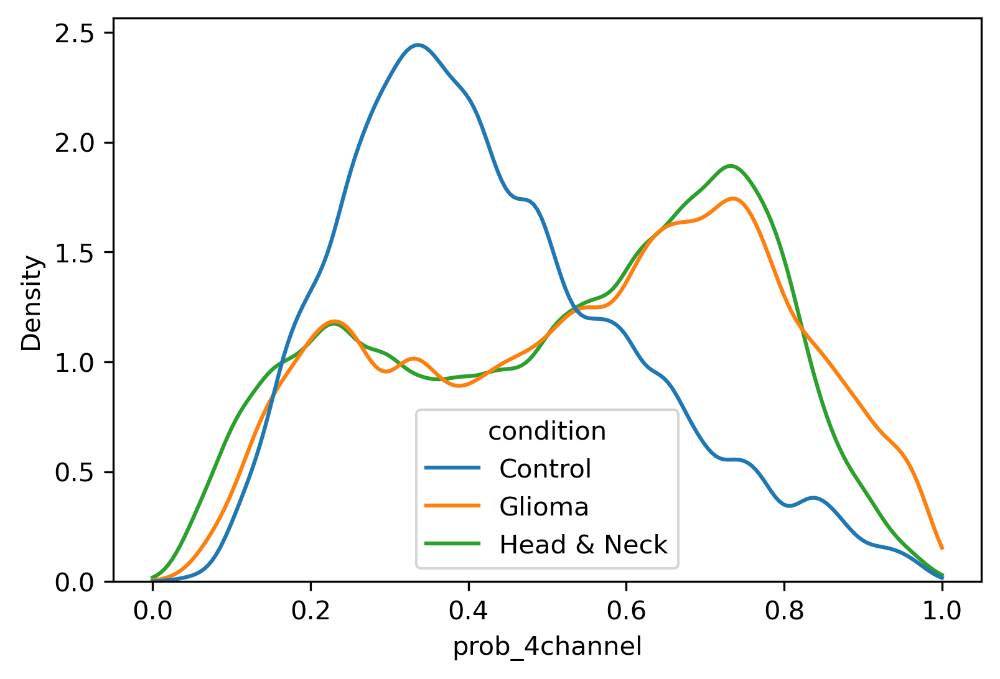

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [96]:
fig, ax = plt.subplots(figsize=[6, 4])
ax = sns.kdeplot(
    data=all_data,
    x="prob_4channel",
    hue="condition",
    bw_adjust=0.5,
    common_norm=False,
    clip=[0, 1],
)

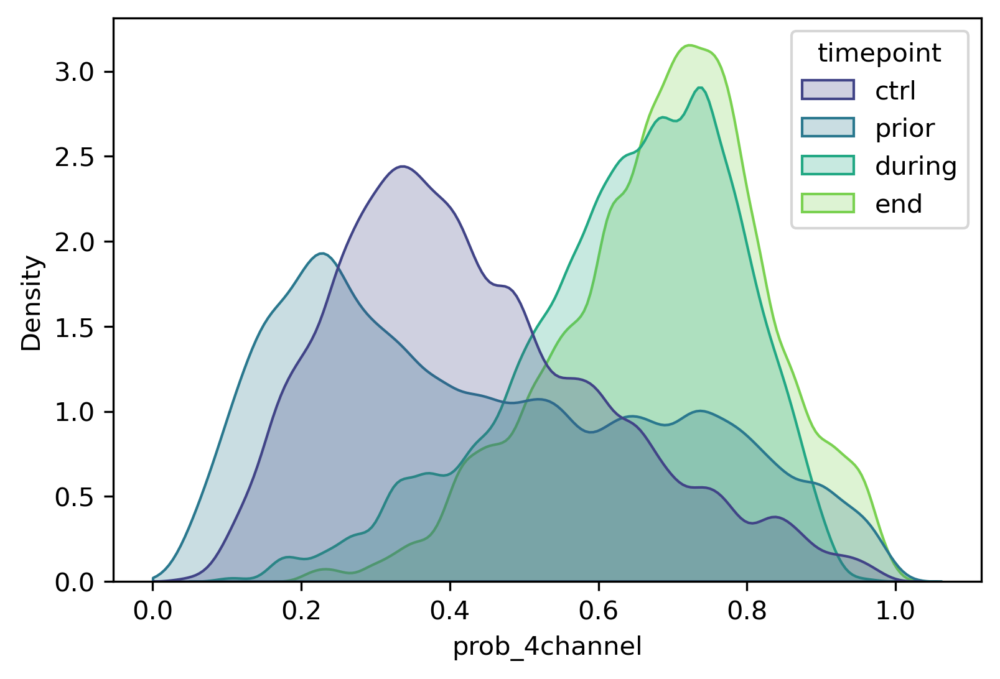

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [97]:
fig, ax = plt.subplots(figsize=[6, 4])
ax = sns.kdeplot(
    data=all_data,
    x="prob_4channel",
    hue="timepoint",
    bw_adjust=0.5,
    common_norm=False,
    palette="viridis",
    fill=True,
    clip=[0, 5],
)

As expected we observe a unimodal distribution for the healthy control population as well as for the treatment populations for the second and third timepoints. The means of the probability of the samples coming from the 4 channel setup also captures the fact that the control population is more likely to come form the 3 channel setup for the controls respectively from the 4 channel setup for the treatment populations. As expected the prior treatment distribution shows two modes corresponding to the samples imaged in the 3 and the 4 channel setup.

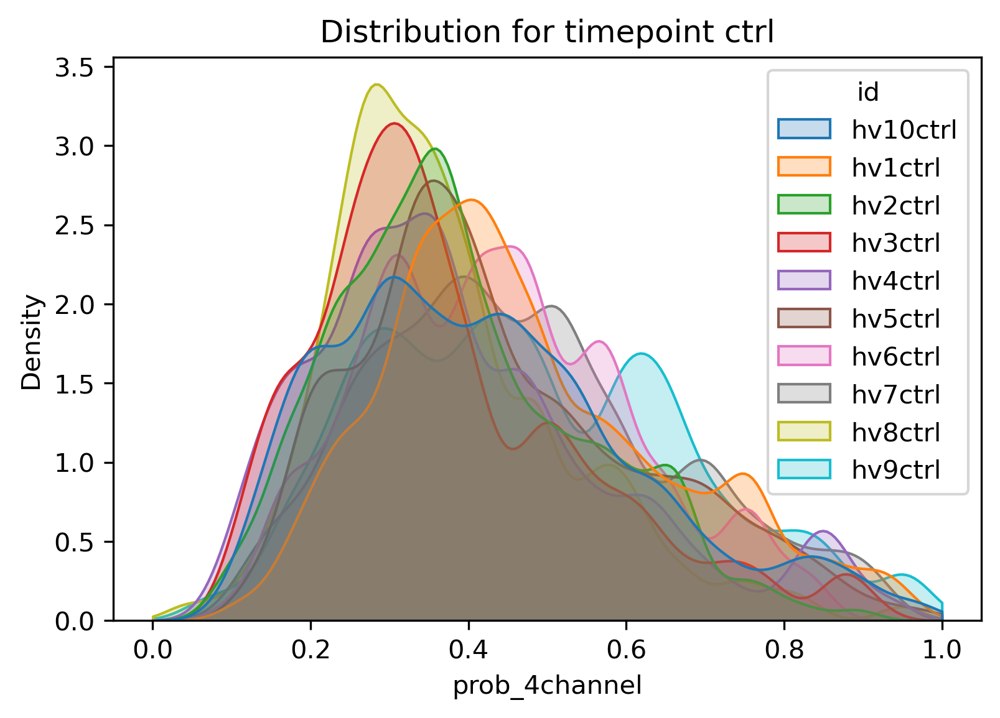

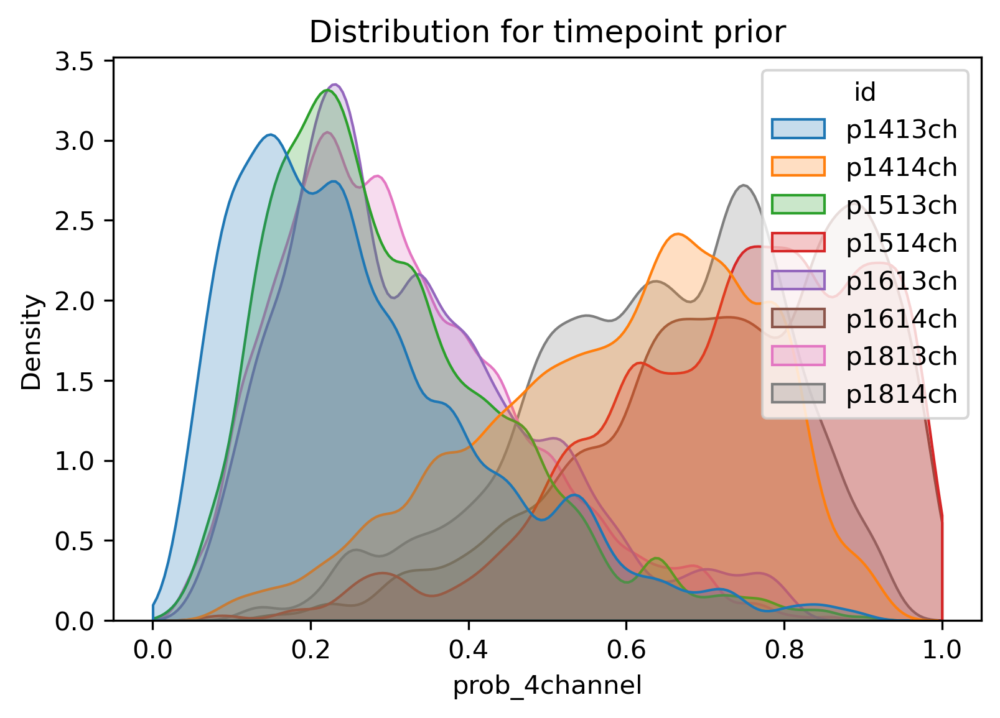

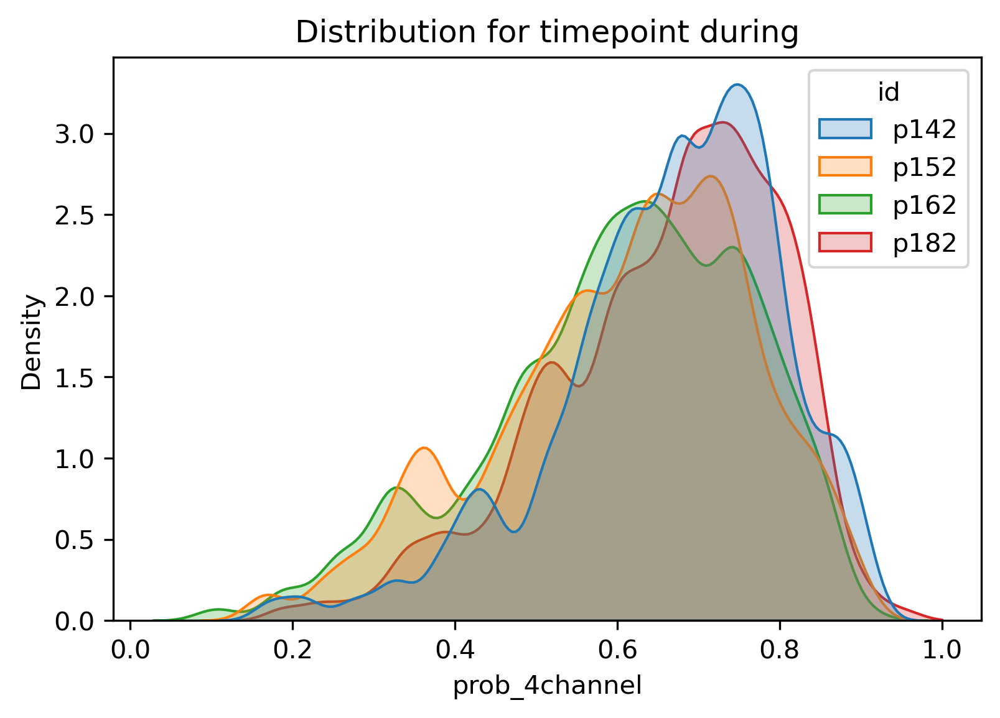

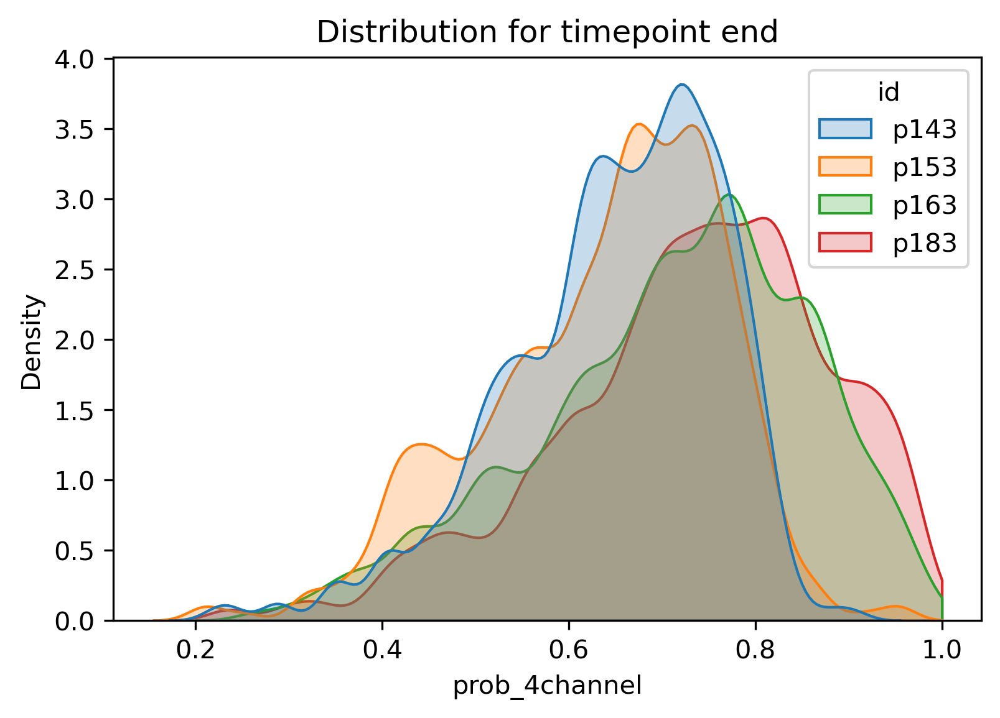

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [107]:
for tp in ["ctrl", "prior", "during", "end"]:
    fig, ax = plt.subplots(figsize=[6, 4])
    ax = sns.kdeplot(
        data=all_data.loc[all_data.timepoint == tp],
        x="prob_4channel",
        hue="id",
        bw_adjust=0.5,
        common_norm=False,
        palette="tab10",
        fill=True,
        clip=[0, 1],
        hue_order=np.unique(all_data.loc[all_data.timepoint == tp, "id"]),
    )
    ax.set_title("Distribution for timepoint {}".format(tp))

The view at each individual sample aligns with the previous observations. Since, we aim to identify a subset of the healthy control cells whose chrometric representation seems to be less affected by the technical batch effect of the varying imaging conditions, we aim to identify a cut-off on the predicted probability of a cell coming from the four channel setup to select such cells from the control condition. To this end, we will look at the cummulative distribution of the predicted probability for the control cells and provide additional guidance by percentiles of the distribution of the predicted probability for all samples coming from the four channel setup.

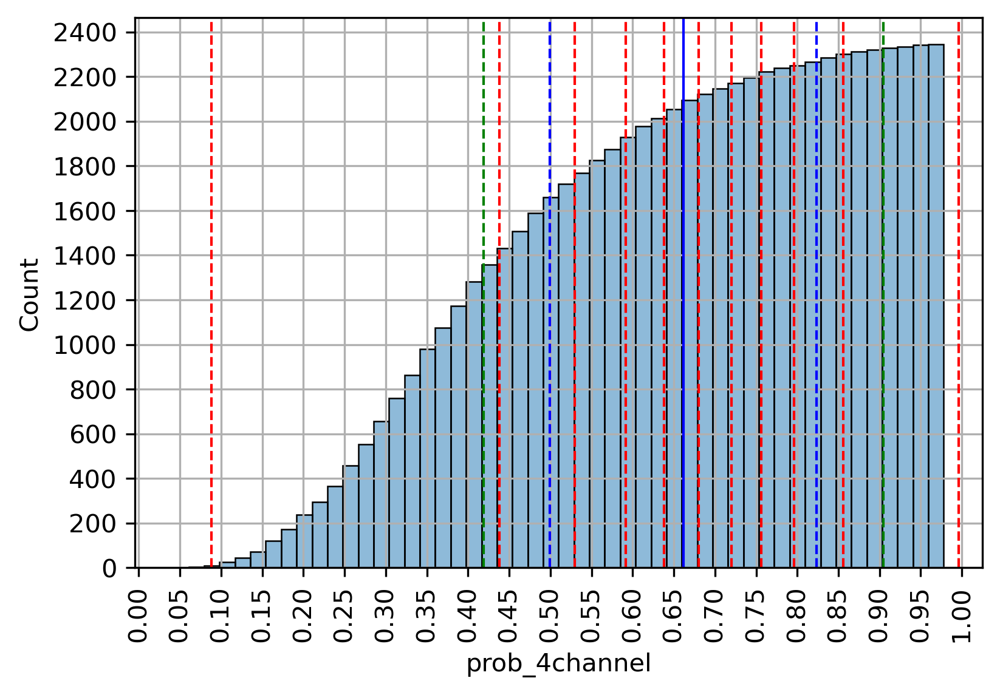

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [188]:
fig, ax = plt.subplots(figsize=[6, 4])
ax = sns.histplot(
    data=all_data.loc[all_data.timepoint == "ctrl"],
    x="prob_4channel",
    cumulative=True,
    bins=50,
    alpha=0.5,
)
for i in range(0, 110, 10):
    ax.axvline(
        np.percentile(all_data.loc[all_data.imaging == "4channel", "prob_4channel"], i),
        linestyle="--",
        c="r",
        lw=1,
        label="{}%tile of 4 channel data".format(i),
    )
ax.axvline(
    x=np.mean(all_data.loc[all_data.imaging == "4channel", "prob_4channel"]),
    c="b",
    lw=1,
)
ax.axvline(
    x=np.mean(all_data.loc[all_data.imaging == "4channel", "prob_4channel"])
    - np.std(all_data.loc[all_data.imaging == "4channel", "prob_4channel"]),
    c="b",
    linestyle="--",
    lw=1,
)
ax.axvline(
    x=np.mean(all_data.loc[all_data.imaging == "4channel", "prob_4channel"])
    + np.std(all_data.loc[all_data.imaging == "4channel", "prob_4channel"]),
    c="b",
    lw=1,
    linestyle="--",
)
ax.axvline(
    x=np.mean(all_data.loc[all_data.imaging == "4channel", "prob_4channel"])
    - 1.5 * np.std(all_data.loc[all_data.imaging == "4channel", "prob_4channel"]),
    c="g",
    linestyle="--",
    lw=1,
)
ax.axvline(
    x=np.mean(all_data.loc[all_data.imaging == "4channel", "prob_4channel"])
    + 1.5 * np.std(all_data.loc[all_data.imaging == "4channel", "prob_4channel"]),
    c="g",
    lw=1,
    linestyle="--",
)
ax.set_yticks(list(range(0, 2500, 200)))
plt.grid()
plt.xticks(np.arange(0, 1.05, 0.05), rotation=90)
plt.show()

Just to test we will quickly assess the class separability when subsetting the 3 channel images of the prior treatment population for which the classifier outputs a probability of the images coming from the four channel setup of the 10% percentile of the distribution of all actual four channel images.

In [219]:
threshold = np.percentile(
    all_data.loc[all_data.imaging == "4channel", "prob_4channel"], 10
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [220]:
tp1_data = all_data.loc[all_data.timepoint == "prior"]
tp1_3ch_data = tp1_data.loc[
    (tp1_data.prob_4channel > threshold) & (tp1_data.imaging == "3channel")
]
print(len(tp1_3ch_data))
tp1_4ch_data = tp1_data.loc[tp1_data.imaging == "4channel"]
print(len(tp1_4ch_data))
filtered_tp1_data = tp1_3ch_data.append(tp1_4ch_data)
sampled_filtered_imaging_cond_data = get_stratified_data(
    filtered_tp1_data,
    id_column="id",
    cond_column="imaging",
    seed=1234,
)
sampled_filtered_imaging_labels = sampled_filtered_imaging_cond_data.loc[:, "imaging"]
sampled_filtered_imaging_sample_labes = sampled_filtered_imaging_cond_data.loc[
    :, "sample"
]
sampled_filtered_imaging_chrometric_data = sampled_filtered_imaging_cond_data.loc[
    :, chrometric_data.columns
]
print(len(sampled_filtered_imaging_cond_data))

572
2100
712


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [221]:
filterd_cond_cv_conf_mtx_patient = get_cv_conf_mtx(
    estimator=rfc,
    features=sampled_filtered_imaging_chrometric_data,
    labels=sampled_filtered_imaging_labels,
    groups=sampled_filtered_imaging_sample_labes,
    scale_features=False,
    n_folds=4,
    order=cond_order,
)
filtered_normalized_cv_conf_mtx_patient = filterd_cond_cv_conf_mtx_patient.divide(
    filterd_cond_cv_conf_mtx_patient.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

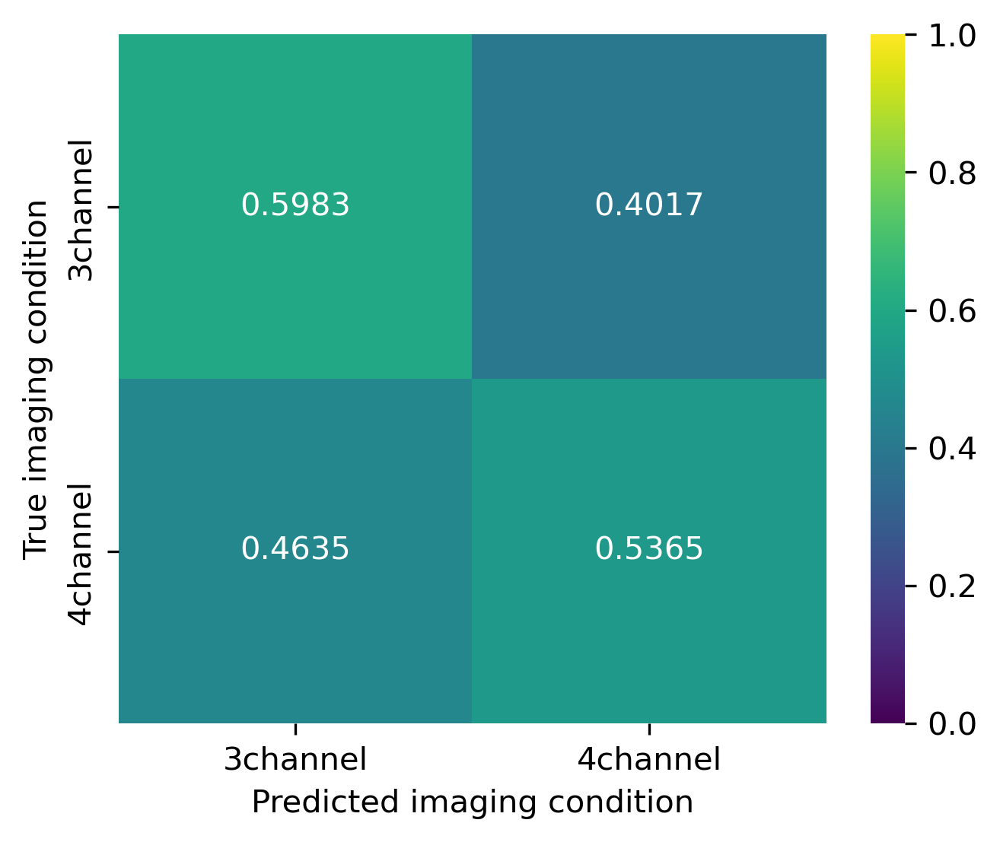

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [222]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    filtered_normalized_cv_conf_mtx_patient,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted imaging condition")
ax.set_ylabel("True imaging condition")
plt.show()

Now note that with the subsetting our data set only consists of 356 nuclei for each condition that is 89 nuclei from each sample (P14, P15, P16, P18) from each imaging condition thus the statistical power is fairly limited. Nonetheless, as expected the filtering selects cells that show characteristics such as a higher HC/EC value which might or might not be due to the technical batch effect.

---

### Nuclear chromatin markers for the difference between the imaging setups

In [207]:
marker_screen_results = find_markers(chrometric_data, imaging_labels)

Run marker screen:   0%|          | 0/2 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [208]:
marker_screen_results.loc[marker_screen_results.label == "3channel"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
52,3channel,extent,0.898777,0.101223,5.090604e-100,2.799832e-98
53,3channel,rel_hc_volume,1.058823,0.058823,4.393500e-95,1.208213e-93
14,3channel,frac_peri_w_polarity_changes,0.899209,0.100791,4.234378e-75,7.763026e-74
15,3channel,kurtosis,0.554860,0.445140,1.338461e-47,1.840384e-46
3,3channel,min_radius,0.906097,0.093903,3.837805e-43,4.221586e-42
8,3channel,std_curvature,1.125635,0.125635,2.489902e-40,2.282410e-39
16,3channel,skewness,1.924123,0.924123,2.916722e-39,2.291710e-38
9,3channel,npolarity_changes,0.911115,0.088885,2.595594e-35,1.784471e-34
12,3channel,num_prominant_neg_curv,1.155688,0.155688,1.281207e-30,7.829601e-30
2,3channel,smallest_largest_calliper,0.959660,0.040340,2.249455e-22,1.237200e-21


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We find that the most significantly different features are a number of features related to DNA intensity distribution, texture and the chromatin content.

---

As a joint proxy to study the alterations in size, we focus at the nuclear volume, the variation in the shape by the concavity as well as the aspect ratio of the nucleus and the change in chromatin compaction by the relative heterochromatin to euchromatin ratio.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:3.243e-13 t=-7.315e+00


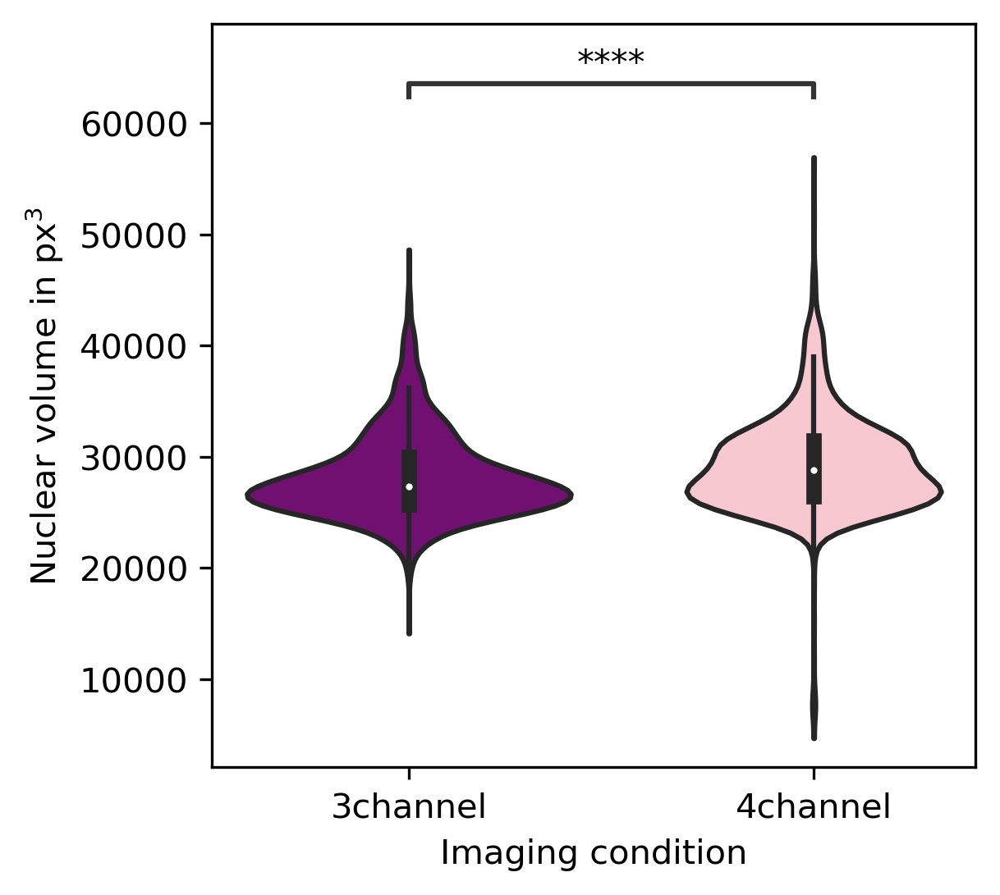

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:2.948e-95 t=2.143e+01


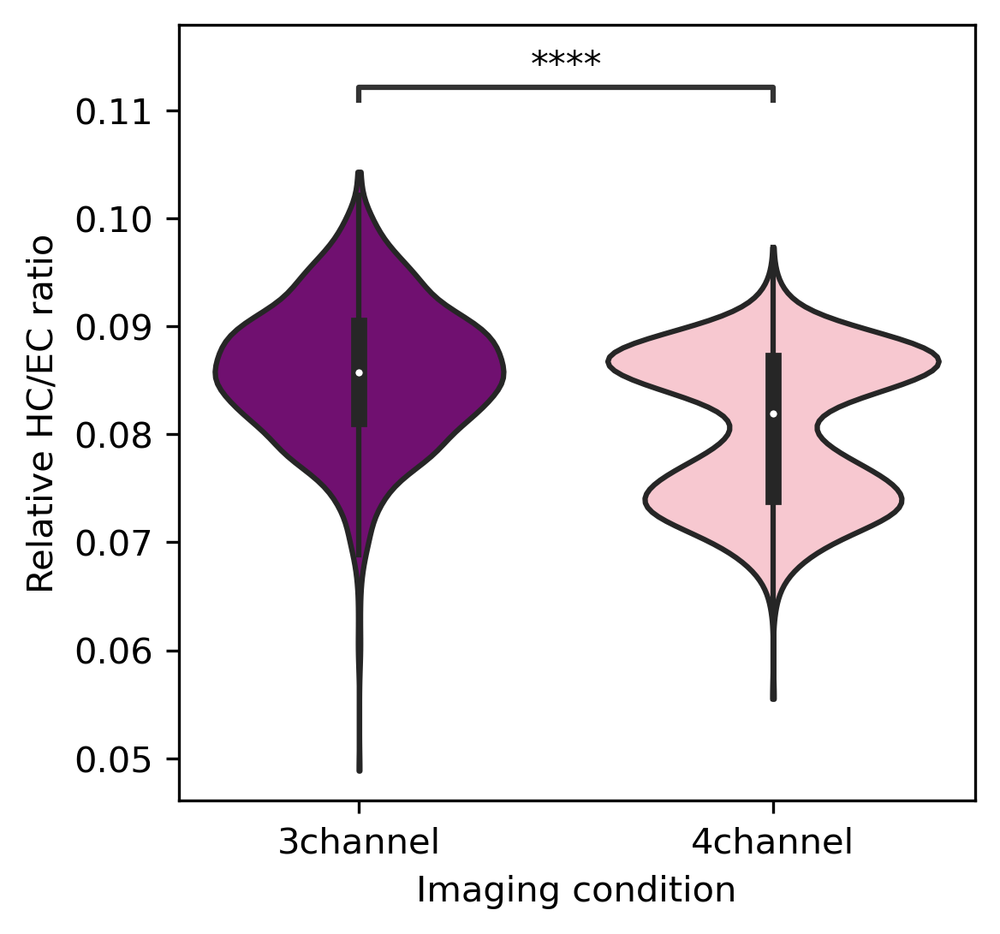

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:2.367e-40 t=1.349e+01


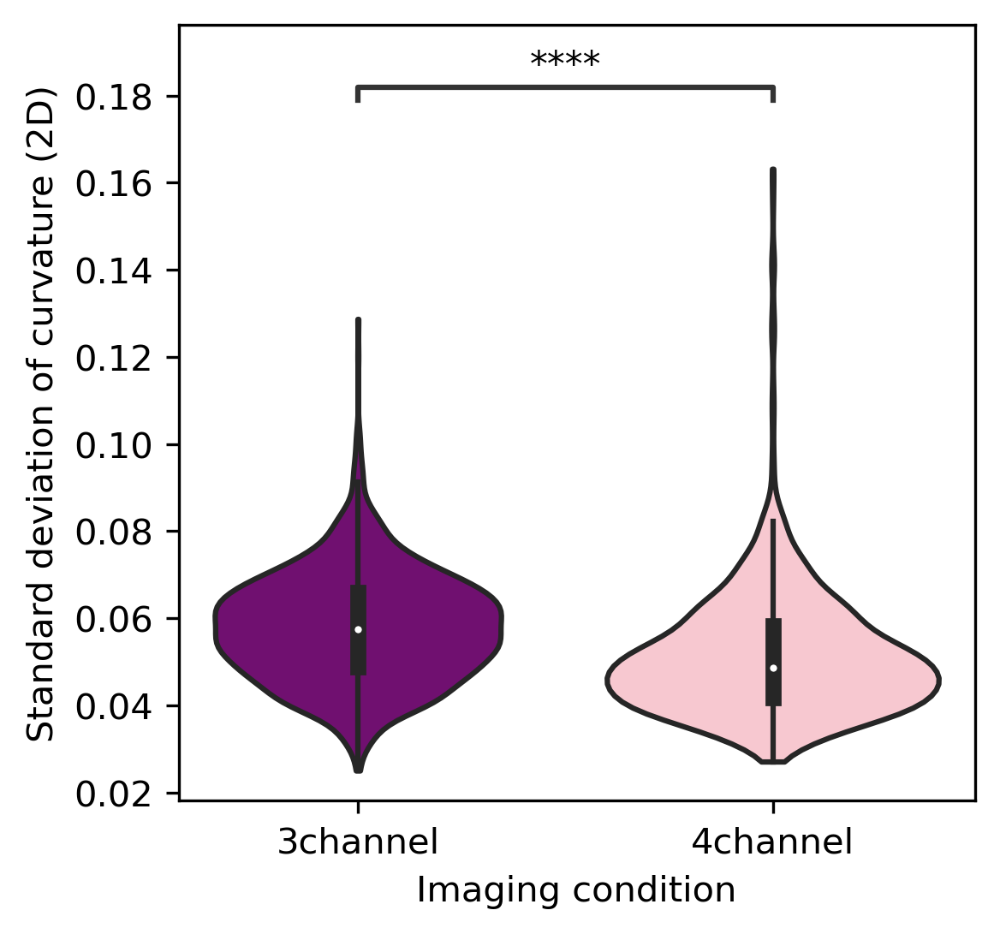

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:1.247e-17 t=-8.599e+00


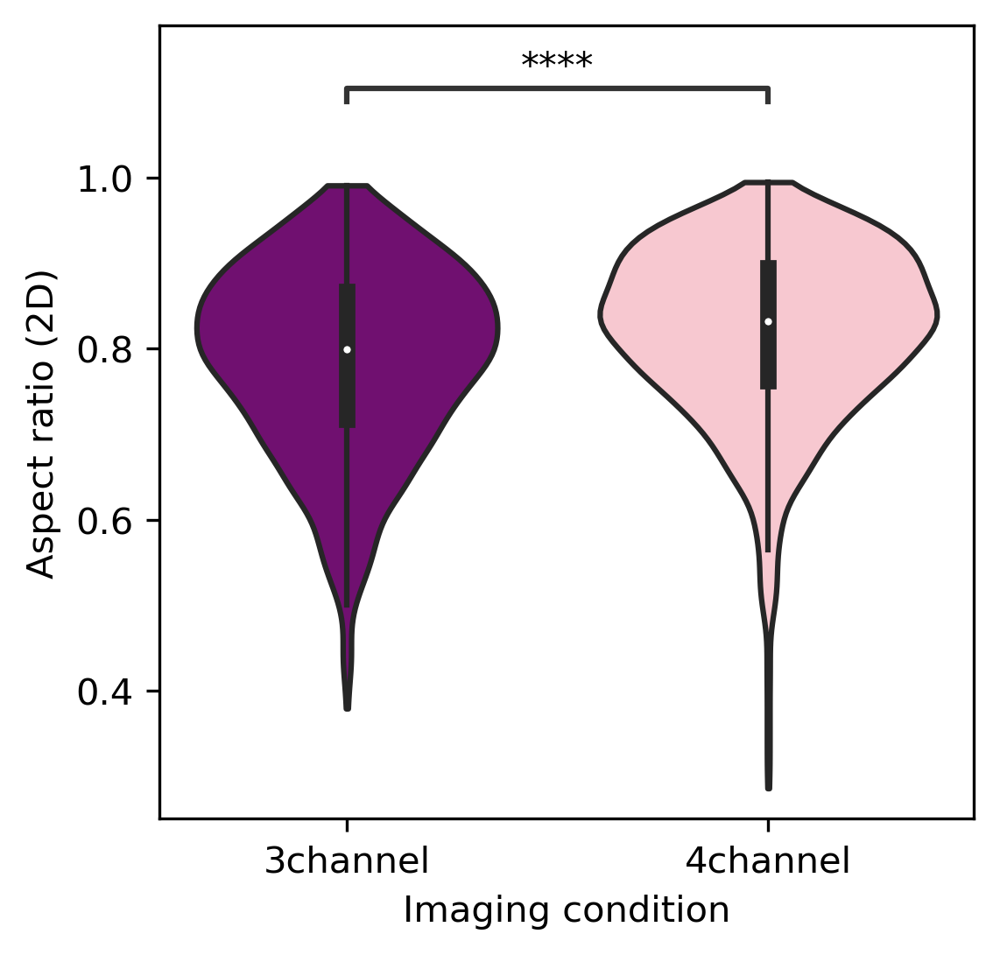

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:1.987e-15 t=7.983e+00


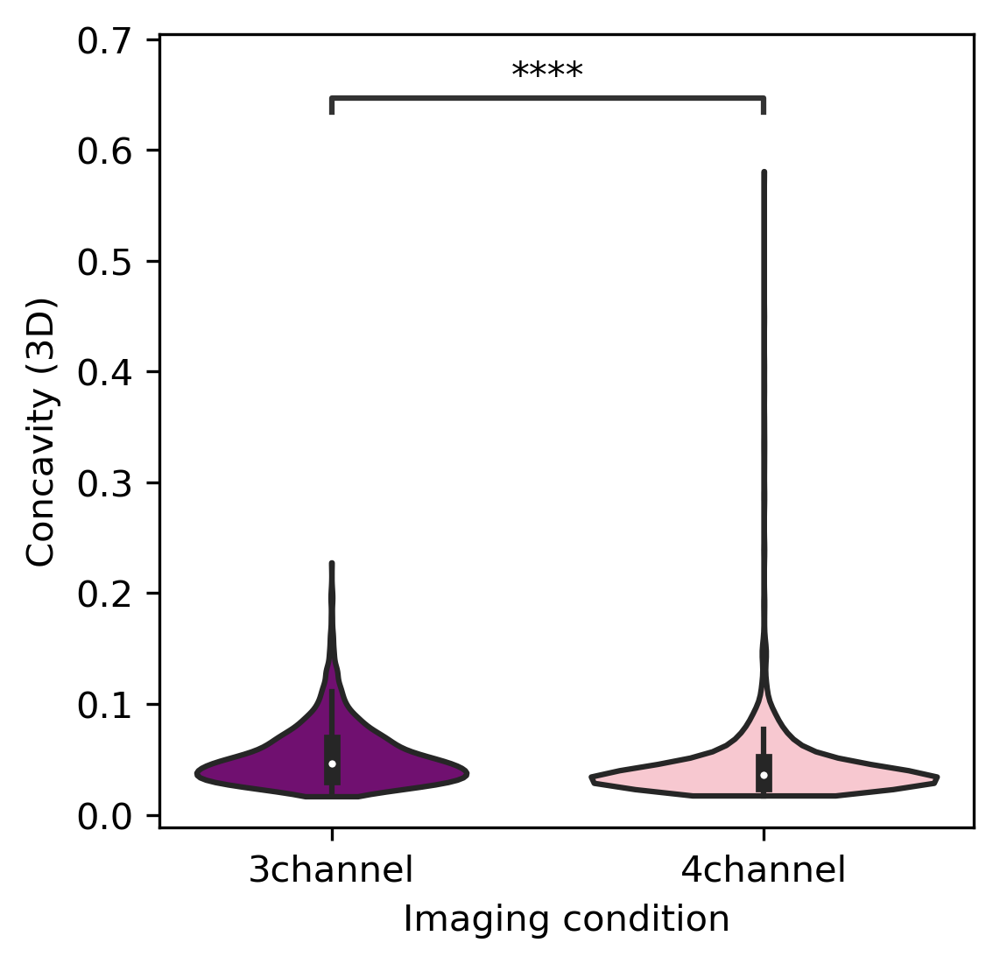

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:1.095e-47 t=-1.475e+01


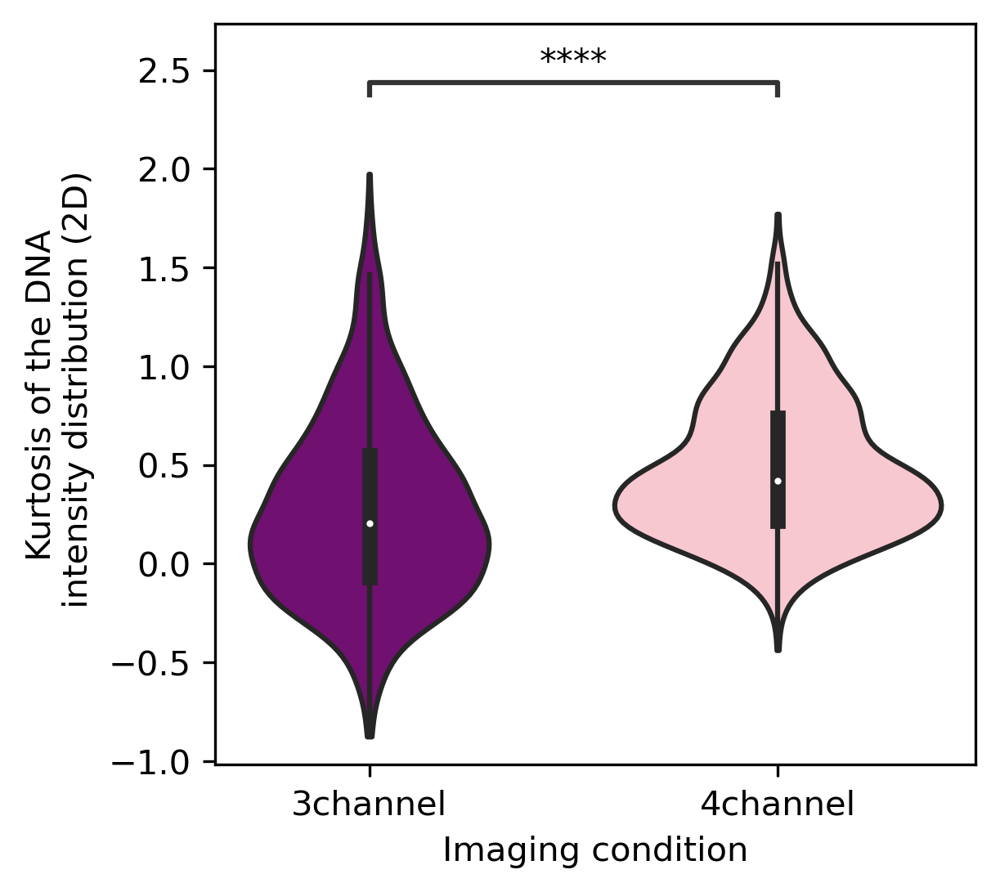

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [223]:
markers = [
    "nuclear_volume",
    "hc_ec_ratio_3d",
    "std_curvature",
    "a_r",
    "concavity",
    "kurtosis",
]
marker_labels = [
    r"Nuclear volume in px$^3$",
    "Relative HC/EC ratio",
    "Standard deviation of curvature (2D)",
    "Aspect ratio (2D)",
    "Concavity (3D)",
    "Kurtosis of the DNA\n intensity distribution (2D)",
]
plot_channel_markers_dist(data, markers, marker_labels, cut=0, palette=color_palette)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:3.243e-13 t=-7.315e+00


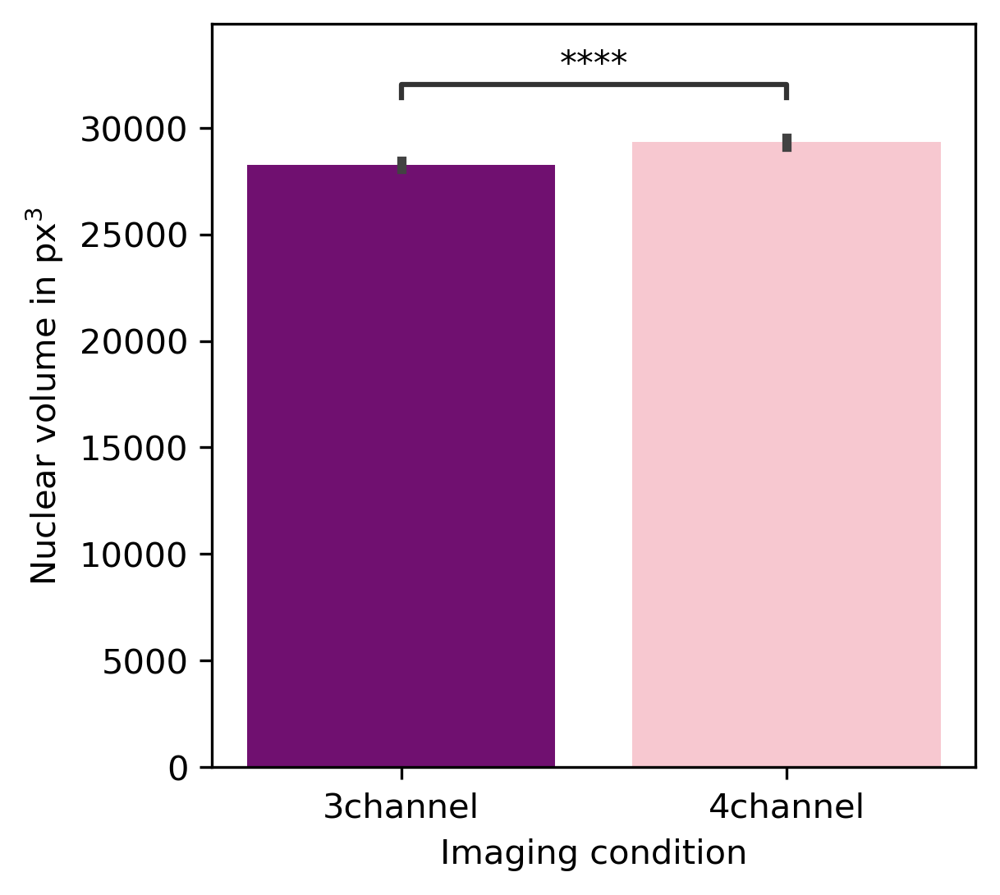

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:2.948e-95 t=2.143e+01


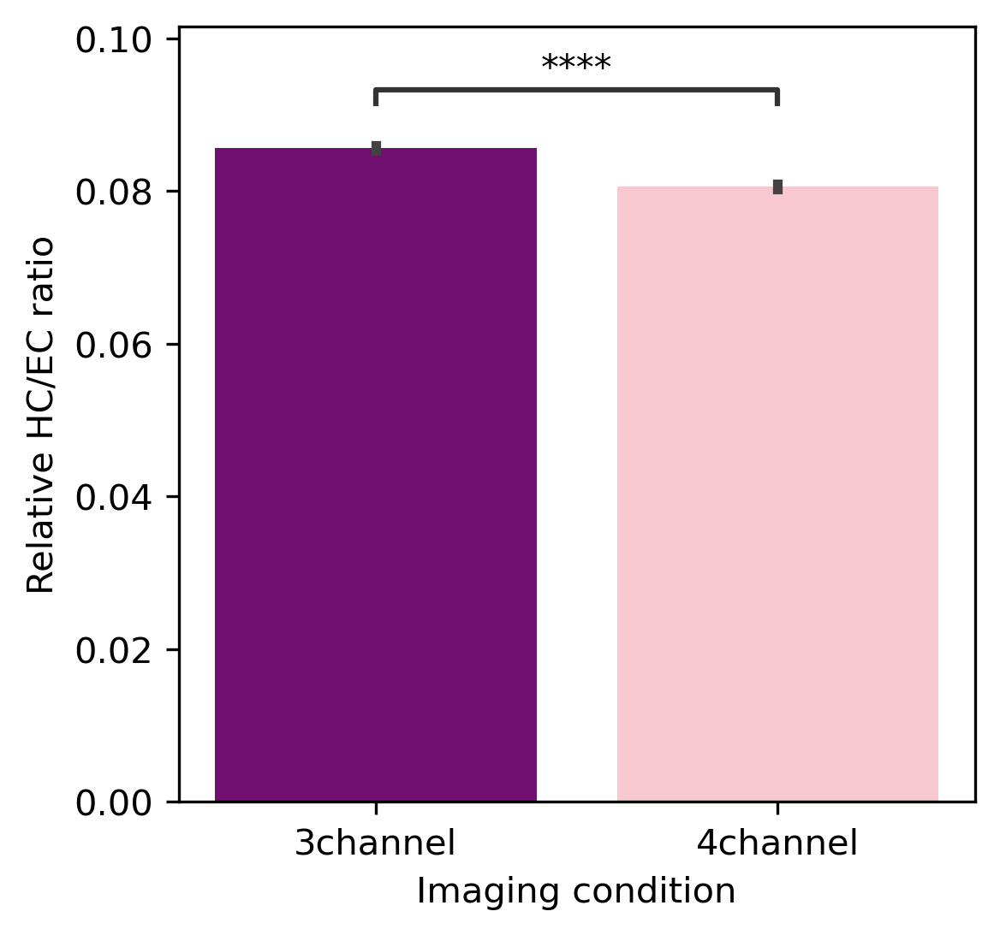

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:6.623e-03 t=2.717e+00


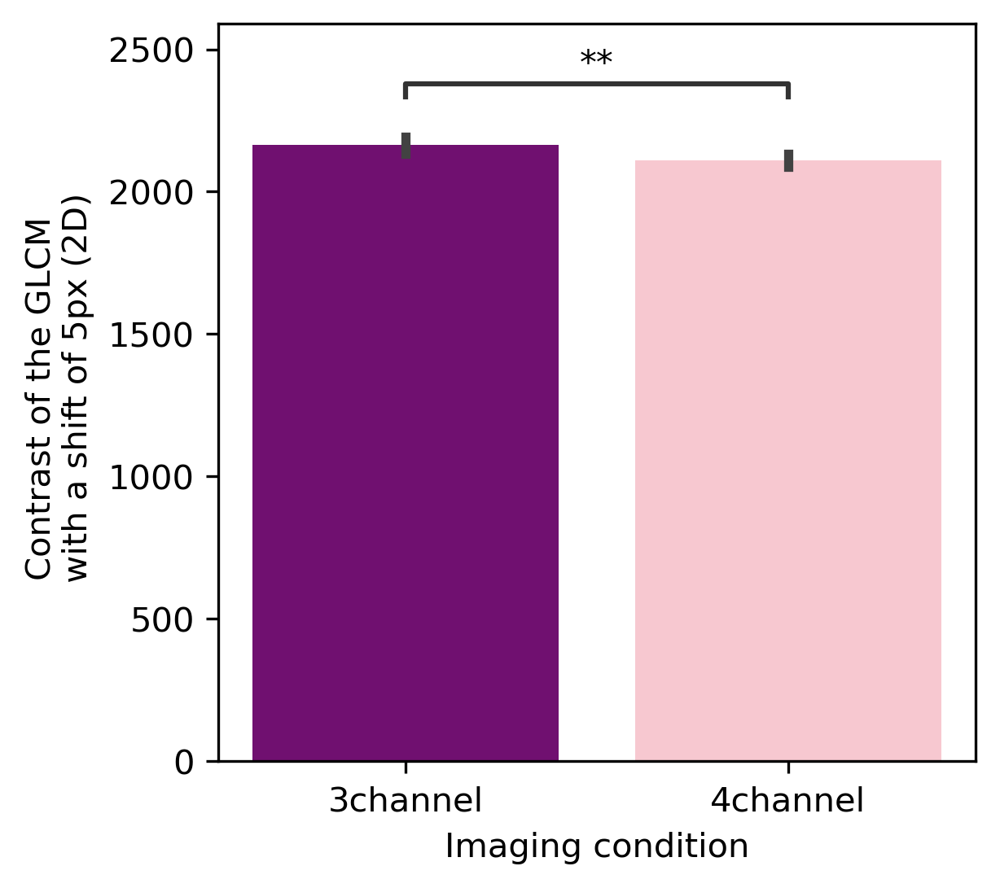

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:1.095e-47 t=-1.475e+01


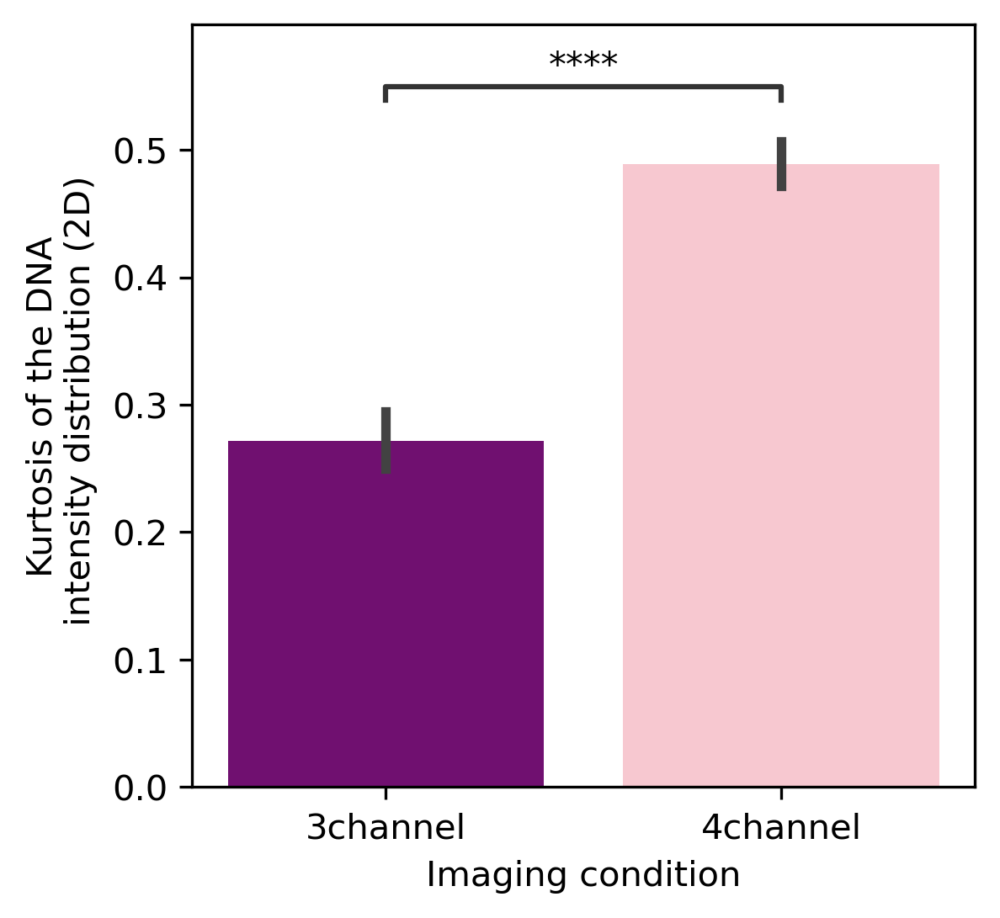

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [212]:
plot_channel_markers_dist(
    data, markers, marker_labels, cut=0, palette=color_palette, plot_type="bar"
)

---

### 3d. Proteomic differences of PBMCs in cancer

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:4.468e-41 t=1.362e+01


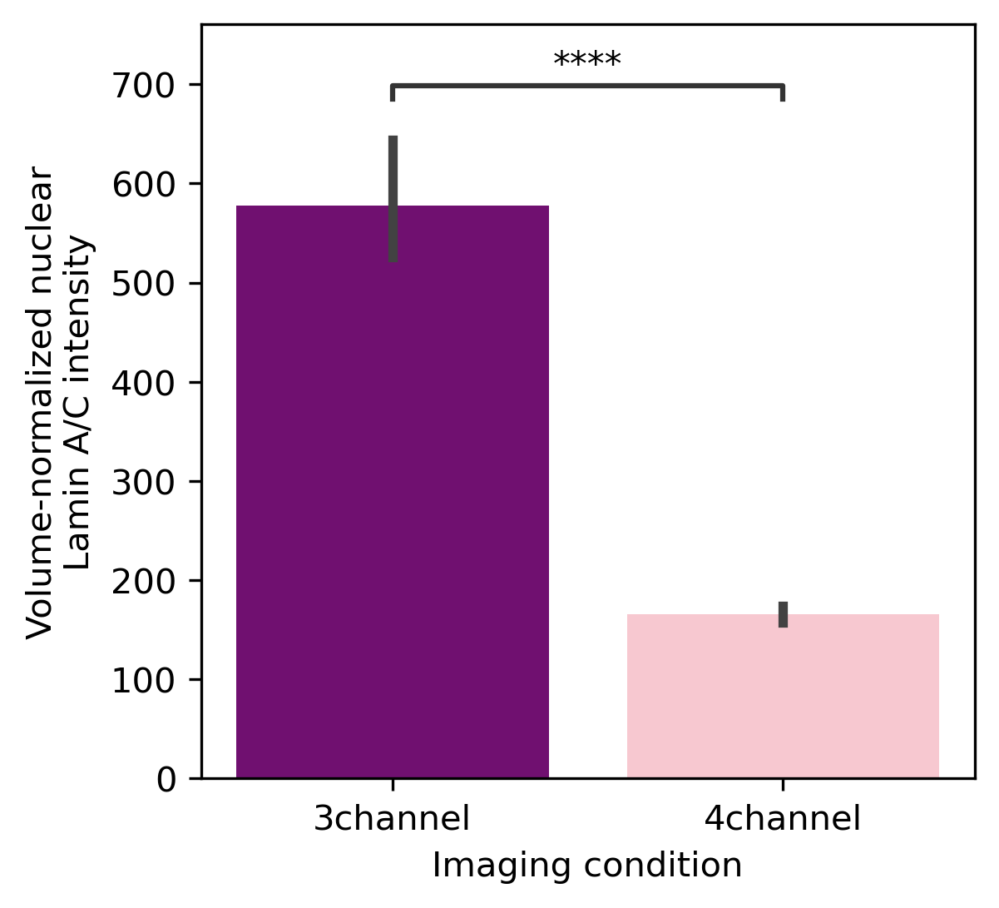

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=4.876e+01


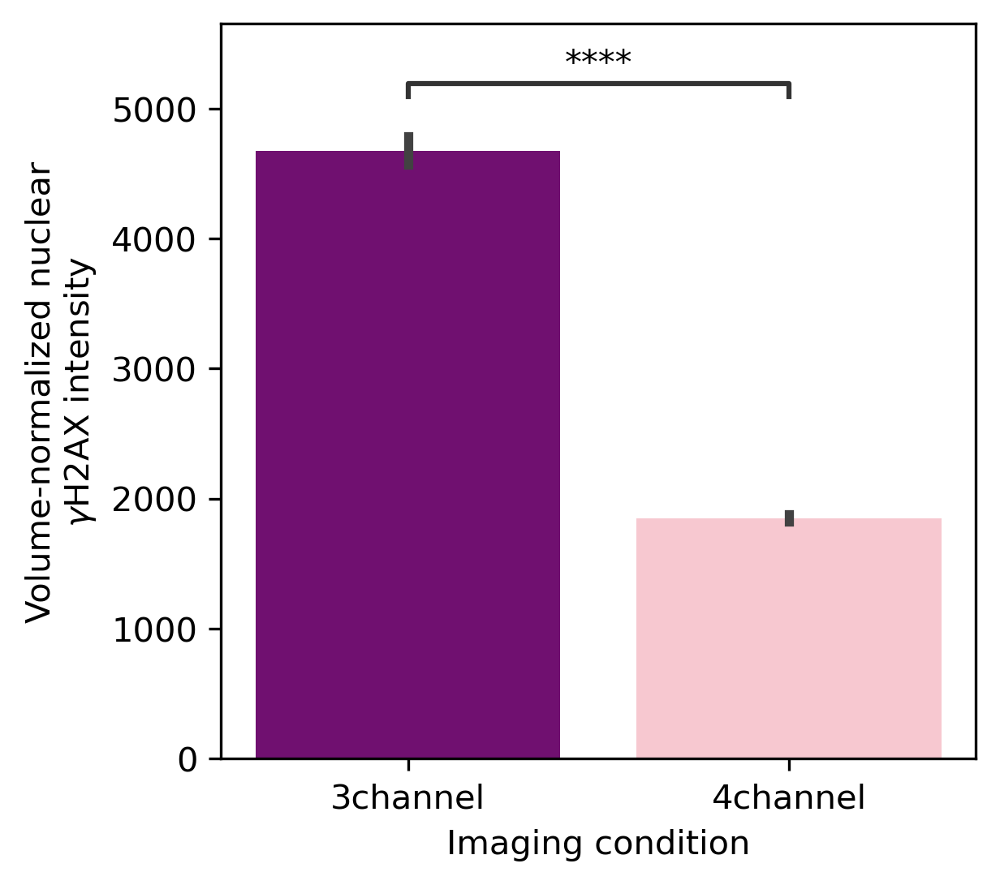

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3channel vs. 4channel: t-test independent samples with Benjamini-Hochberg correction, P_val:4.405e-06 t=4.599e+00


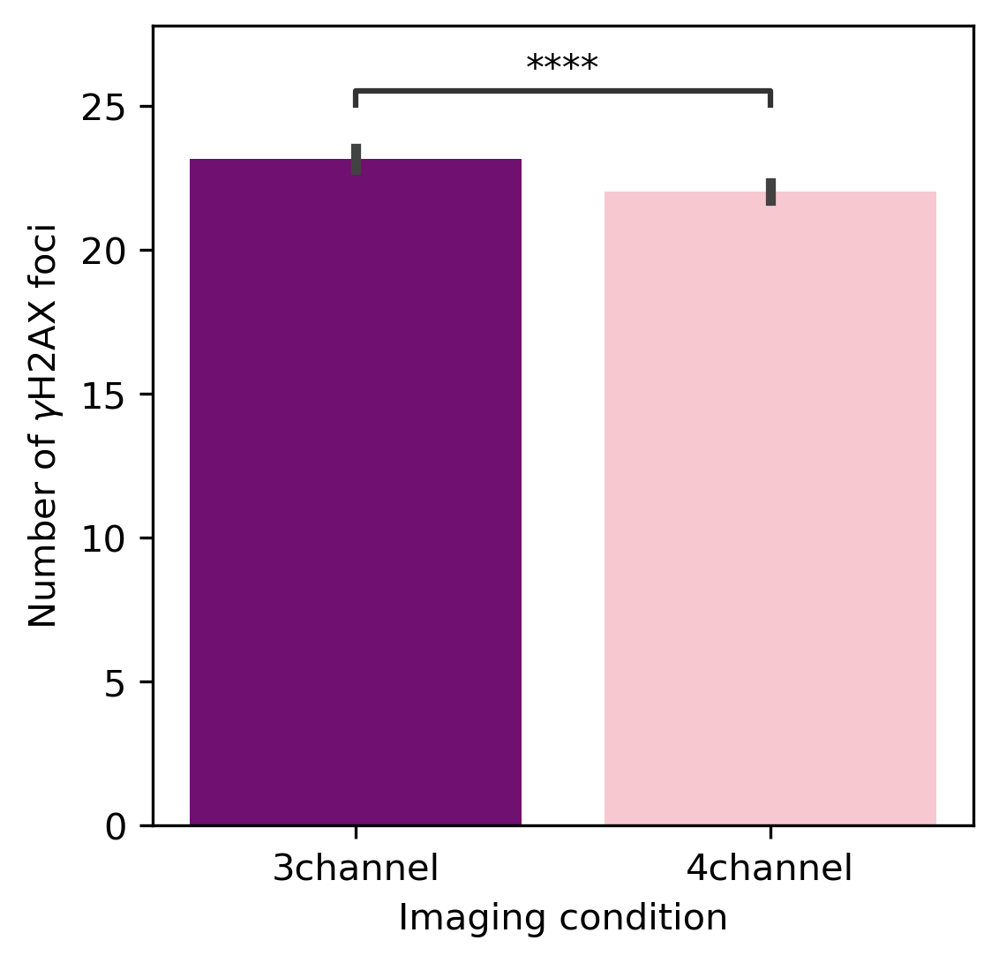

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [213]:
markers = ["rel_lamin_3d_int", "rel_gh2ax_3d_int", "gh2ax_foci_count"]
marker_labels = [
    "Volume-normalized nuclear\nLamin A/C intensity",
    "Volume-normalized nuclear\n" r"$\gamma$H2AX intensity",
    r"Number of $\gamma$H2AX foci",
]
plot_channel_markers_dist(
    data,
    markers,
    marker_labels,
    quantiles=None,
    cut=0,
    plot_type="bar",
    palette=color_palette,
)

---

## 4. Supplemental